## Imports

In [42]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import muon as mu
import scanpy as sc
import mofax
import anndata as ad
from scipy.stats import pearsonr
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

## Define some paths

In [43]:
# Define the folder containing data.
data_folder = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/data/"

# Define the folder where to save figures.
fig_folder = "/users/csb/huizing/Documents/PhD/Code/"
fig_folder += "mowgli_reproducibility/visualize/figures/"

# Define the folder for enrichment results.
enrich_folder = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/"

# Define the folder containing Mowgli's embeddings.
w_folder = "/users/csb/huizing/Documents/PhD/Code/Mowgli/local_analysis/from_jz/w/"

# Define the folder containing Mowgli's loadings.
h_folder = "/users/csb/huizing/Documents/PhD/Code/Mowgli/local_analysis/from_jz/h/"

## Loading the data

In [44]:
# Load the raw RNA signal.
rna_all_genes = mu.read_10x_h5(
    data_folder
    + "TEA/GSM4949911_X061-AP0C1W1_leukopak_perm-cells_"
    + "tea_fulldepth_cellranger-arc_filtered_feature_bc_matrix.h5",
    extended=False,
)["rna"]

# Compute quality control metrics and perform basic preprocessing.
rna_all_genes.var["mt"] = rna_all_genes.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    rna_all_genes,
    qc_vars=["mt"],
    percent_top=None,
    log1p=False,
    inplace=True,
)
mu.pp.filter_obs(rna_all_genes, "n_genes_by_counts", lambda x: (x >= 500) & (x < 4_500))
mu.pp.filter_obs(rna_all_genes, "total_counts", lambda x: x < 12_000)
mu.pp.filter_obs(rna_all_genes, "pct_counts_mt", lambda x: x < 30)
mu.pp.filter_var(rna_all_genes, "n_cells_by_counts", lambda x: x >= 10)
sc.pp.normalize_total(rna_all_genes, target_sum=1e4)  # Perform per-cell normalization.
sc.pp.log1p(rna_all_genes)  # Log-transform the counts.

# Load the preprocessed data.
mdata = mu.read_h5mu(data_folder + "TEA/tea_preprocessed.h5mu.gz")

# Load the MOFA model.
mofa_model = mofax.mofa_model(data_folder + "TEA/tea_mofa_15.hdf5")
mdata.obsm["X_mofa"] = mofa_model.get_factors()

# Load the Mowgli model.
mdata.obsm["X_mowgli"] = np.load(
    w_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()["W"]

# This is needed somehow.
mdata.uns = {}

# Subset rna_all_genes to the cells in mdata.
rna_all_genes = rna_all_genes[mdata["rna"].obs_names]
rna_all_genes.var_names_make_unique()

# Load MOFA+'s loadings.
H_mofa = {
    "H_rna": mofa_model.get_weights("rna"),
    "H_atac": mofa_model.get_weights("atac"),
    "H_adt": mofa_model.get_weights("adt"),
}

# Load Mowgli's loadings.
H_mowgli = np.load(
    h_folder + "tea_mowgli_cosine_50_0_05_rna_0_01_atac_0_1_adt_0_01_0_001.npy",
    allow_pickle=True,
).item()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [45]:
# Define the method used for enrichement.
enrichment_file = "gprofiler"  # or "fgsea" or "enrichr"

# Get fgsea results.
if enrichment_file == "fgsea":

    # Load the fgsea results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "fgsea.csv", index_col=0)
    cols = {"pathway": "native", "col": "dim", "pval": "p_value"}
    enr.rename(columns=cols, inplace=True)
    enr["dim"] = enr["dim"].str.replace("X", "").astype(int)

# Get gprofiler results.
elif enrichment_file == "gprofiler":

    # Load the gprofiler results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "enrichment.csv", index_col=0)
    enr["dim"] = enr["query"].str.split(" ", expand=True)[1].astype(int)

# Get enrichr results.
elif enrichment_file == "enrichr":

    # Load the enrichr results, rename columns and make dimensions integers.
    enr = pd.read_csv(enrich_folder + "enrichr.csv", index_col=0)
    enr.rename(columns={"path_name": "native", "adj_p_val": "p_value"}, inplace=True)

# Add some more columns.
enr["name"] = enr["native"]
enr = enr[enr["p_value"] < 0.05]
enr["minlogp"] = -np.log10(enr["p_value"])

In [46]:
all_motifs = pd.DataFrame({})

# Mowgli
motifs_path = "/users/csb/huizing/Documents/PhD/Code/mowgli_reproducibility/enrich/top_motifs_mowgli/"
for i in range(50):
    motifs = pd.read_csv(motifs_path + f"motifs_{i}.csv", index_col=0)
    motifs = motifs[motifs["p.adjust"] < .05]
    motifs = motifs[motifs["motif"].str.startswith("MA")]
    motifs["dim"] = i
    motifs["method"] = "mowgli"
    all_motifs = pd.concat((all_motifs, motifs))

all_motifs["minlogp"] = -np.log10(all_motifs["p.adjust"])

In [47]:
rna_all_genes.var_names = ["rna:" + x for x in rna_all_genes.var_names]

## Plot Mowgli

In [48]:
# Compute the UMAP embedding
sc.pp.neighbors(mdata, n_neighbors=25, key_added="mowgli_neighbors", use_rep="X_mowgli")
sc.tl.leiden(mdata, resolution=0.2, key_added="mowgli_leiden", neighbors_key="mowgli_neighbors")
sc.tl.umap(mdata, neighbors_key="mowgli_neighbors")

In [49]:
# Annotate the Mowgli embedding.
mowgli_cluster_names = {
    0: "B cells",
    1: "CD4 T cells",
    2: "CD4 T cells",
    3: "CD8 T cells",
    4: "CD4 T cells",
    5: "Monocytes",
    6: "NK cells",
    7: "MAIT T cells",
    8: "Erythroid cells",
}
codes = mdata.obs["mowgli_leiden"].cat.codes
mdata.obs["annotation_mowgli"] = [mowgli_cluster_names[c] for c in codes]

/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'annotation_mowgli' as categorical
/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'atac:gene_ids' as categorical
/users/csb/huizing/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a

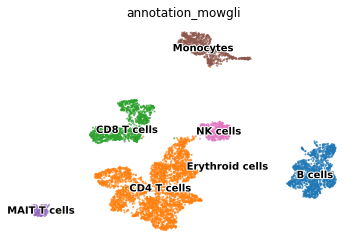

In [50]:
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color="annotation_mowgli",
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()

In [51]:
mdata.obs[mdata["adt"].var_names] = mdata["adt"].X

In [52]:
mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]

In [59]:
H_adt = ad.AnnData(H_mowgli["H_adt"])
H_adt.X /= H_adt.X.std(axis=1, keepdims=True)
H_adt.obs_names = mdata["adt"].var_names.str.replace("adt:", "")

H_rna = ad.AnnData(H_mowgli["H_rna"])
H_rna.X /= H_rna.X.std(axis=1, keepdims=True)
H_rna.obs_names = mdata["rna"].var_names.str.replace("rna:", "")

In [60]:
def plot_zoom(dim=44, zoom_into_cluster="B cells", **kwargs):
    idx_zoom = mdata.obs["annotation_mowgli"].str.contains(zoom_into_cluster)
    fig, axes = plt.subplots(2, 3, figsize=(20, 9))
    sc.pl.umap(
        mdata,
        alpha=0.7,
        color="annotation_mowgli",
        legend_loc=None,
        title=f"Mowgli factor {dim}",
        legend_fontoutline=2,
        frameon=False,
        show=False,
        ax=axes[0, 0],
    )
    axins = inset_axes(
        axes[0, 0],
        "40%",
        "60%",
        borderpad=3,
        loc="upper left",
        bbox_to_anchor=(0.4, 0, 1, 1),
        bbox_transform=axes[0, 0].transAxes,
    )
    sc.pl.umap(
        mdata[idx_zoom],
        alpha=0.7,
        color=[f"mowgli:{dim}"],
        legend_loc=None,
        legend_fontoutline=2,
        # frameon=False,
        show=False,
        ax=axins,
        **kwargs,
    )

    obsm = mdata[idx_zoom].obsm["X_umap"]
    x1, x2 = np.percentile(obsm[:, 0], 1) - 1, np.percentile(obsm[:, 0], 95) + 1.5
    y1, y2 = np.percentile(obsm[:, 1], 1) - 1, np.percentile(obsm[:, 1], 95) + 1.5
    # x1, x2, y1, y2 = 12, 18, -6, 3
    axins.set_xlim(x1, x2)
    axins.set_ylim(y1, y2)
    axins.set_title(None)
    axins.set_xlabel(None)
    axins.set_ylabel(None)
    axins.set_facecolor((1, 1, 1, .85))
    rect, lines = axes[0, 0].indicate_inset_zoom(axins)
    lines[0].set_visible(True)
    lines[1].set_visible(True)
    lines[2].set_visible(True)
    lines[3].set_visible(True)

    fig.axes[7].remove()

    idx = np.argsort(H_rna.X[:, dim])[::-1][:15]
    sns.barplot(
        y=H_rna.obs_names[idx],
        x=H_rna.X[idx, dim],
        ax=axes[0, 1],
        palette="Blues_r",
    )
    axes[0, 1].set_title(f"RNA weights for factor {dim}")

    idx = np.argsort(H_adt.X[:, dim])[::-1][:15]
    sns.barplot(
        y=H_adt.obs_names[idx],
        x=H_adt.X[idx, dim],
        ax=axes[0, 2],
        palette="Blues_r",
    )
    axes[0, 2].set_title(f"ADT weights for factor {dim}")

    axes[1, 0].remove()

    idx = enr["source"] == "GO_Biological_Process_2021"
    idx &= enr["dim"] == dim
    df = enr[idx].sort_values("minlogp", ascending=False).head(15)
    if np.sum(idx) > 0:
        sns.barplot(
            data=df,
            x="minlogp",
            y=df["name"].apply(lambda x: x[:-13]),
            ax=axes[1, 1],
            palette="Blues_r",
            estimator=max,
            ci=None,
        )
        axes[1, 1].set_title(f"Gene set enrichment for factor {dim}")
        axes[1, 1].set_ylabel(None)
    else:
        axes[1, 1].remove()

    idx = all_motifs["dim"] == dim
    if np.sum(idx) > 0:
        sns.barplot(
            data=all_motifs[idx].head(15),
            y="motif.name",
            x="minlogp",
            ax=axes[1, 2],
            palette="Blues_r",
        )
        axes[1, 2].set_title(f"Motif enrichment for factor {dim}")
        axes[1, 2].set_ylabel(None)
    else:
        axes[1, 2].remove()

    plt.show()


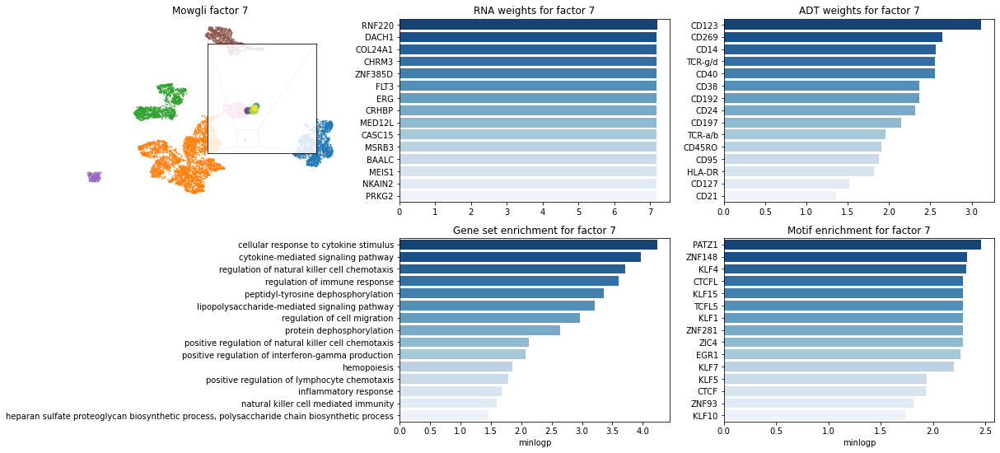

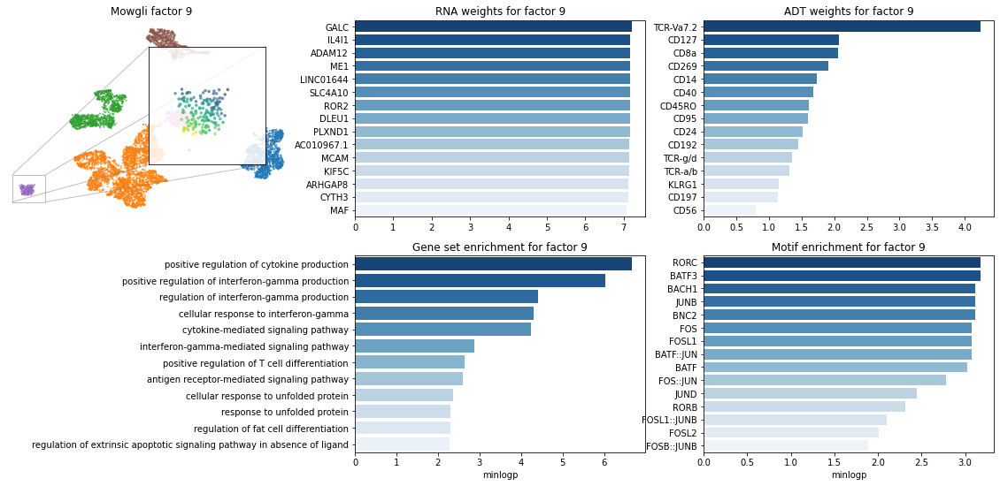

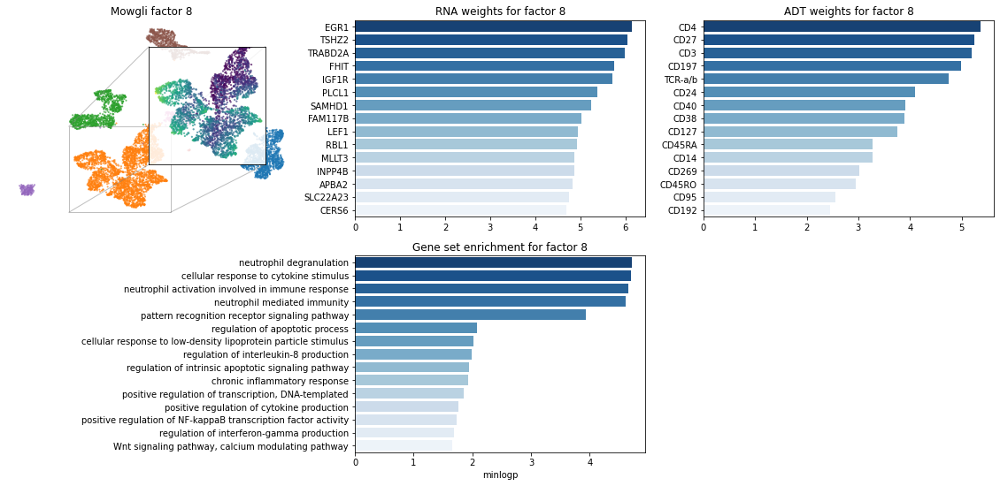

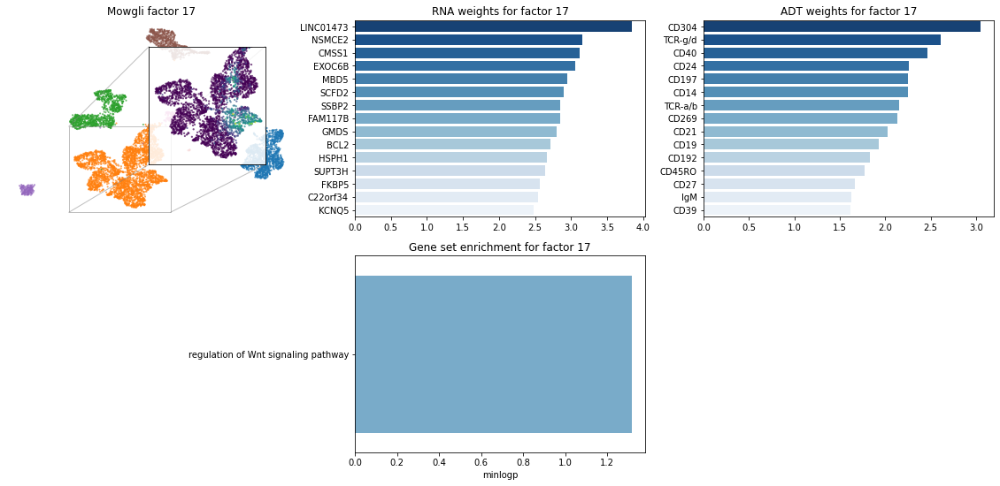

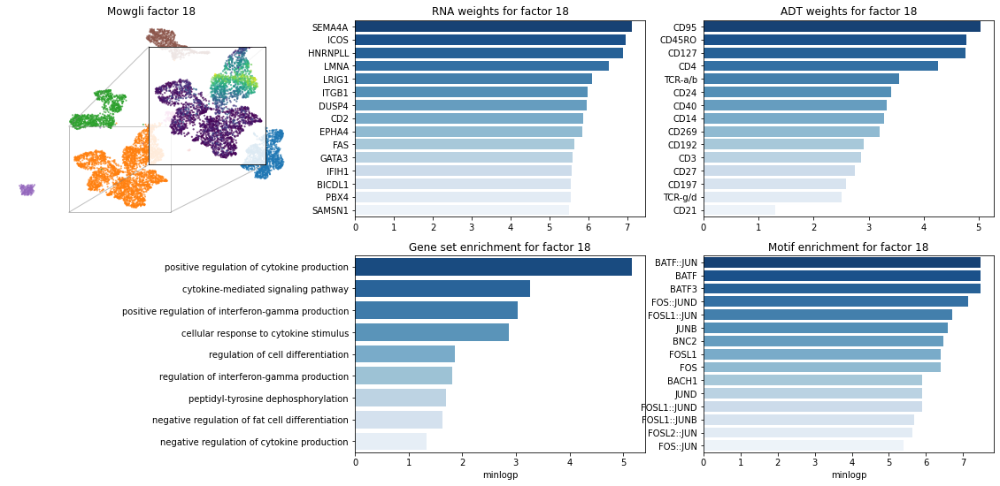

...

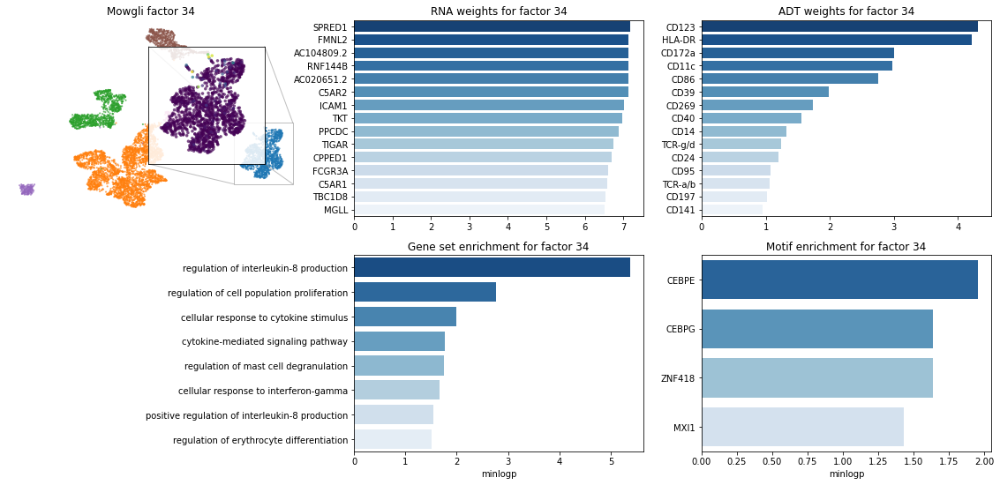

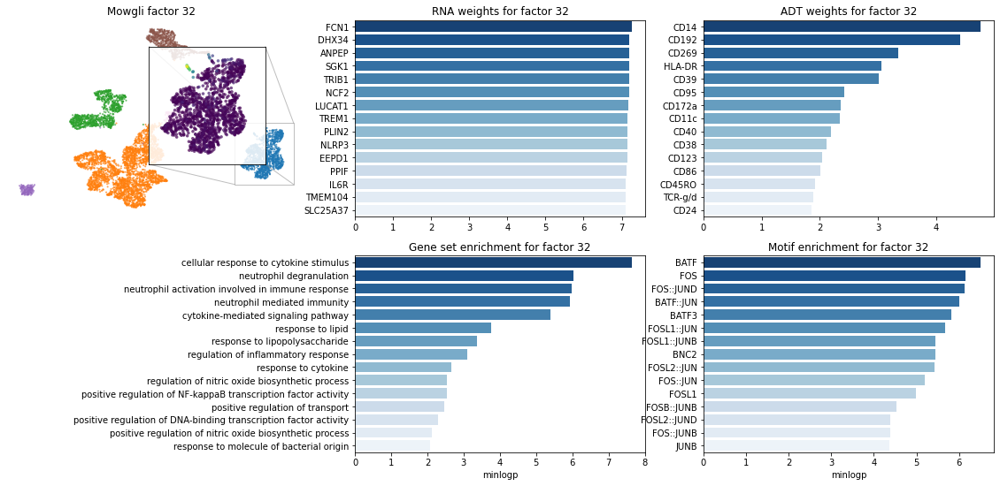

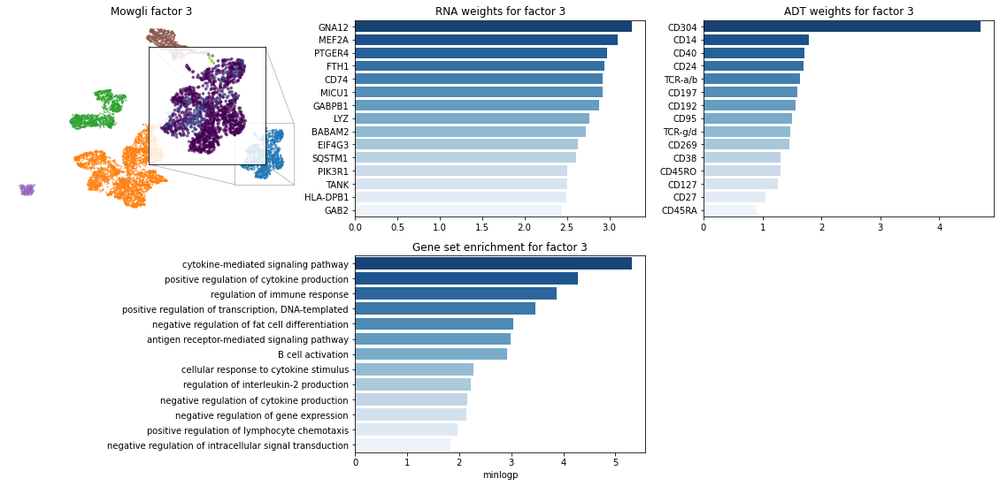

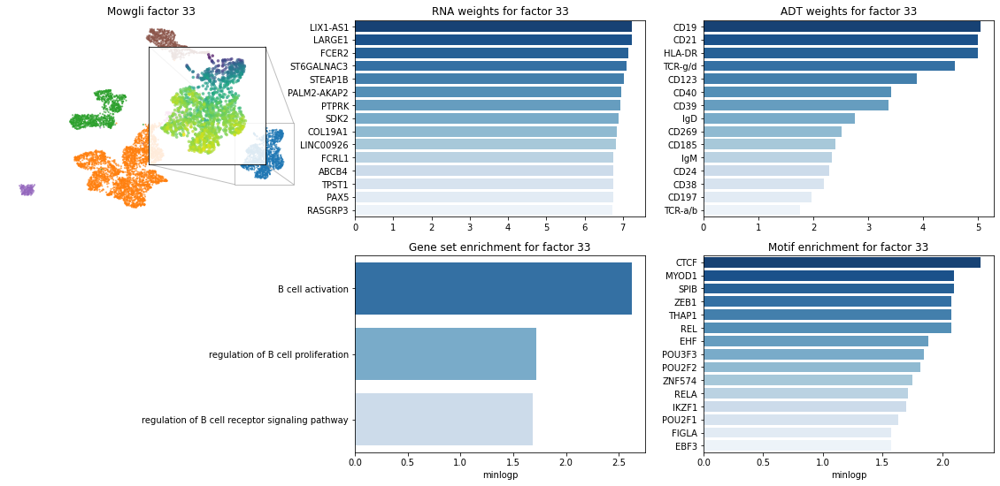

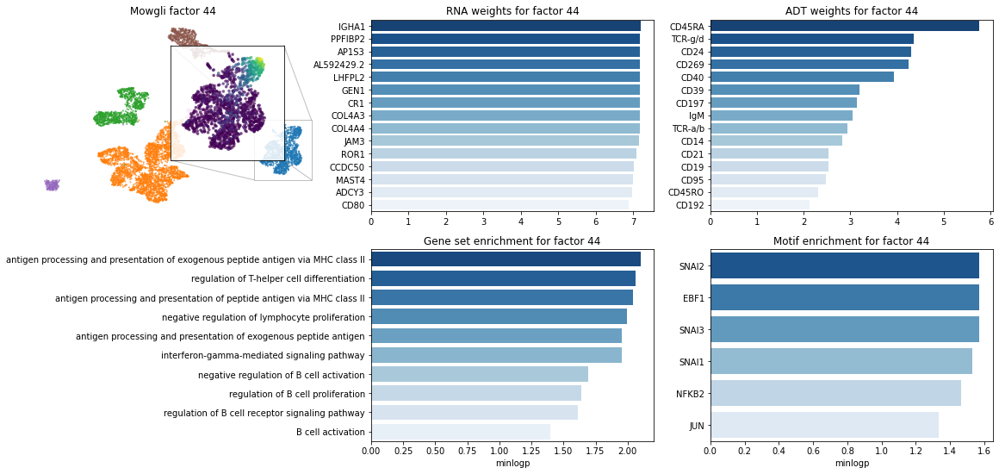

In [62]:
plot_zoom(7, "Eryth", s=300)
plot_zoom(9, "MAIT", s=50)
plot_zoom(8, "CD4", s=20)
plot_zoom(17, "CD4", s=20)
plot_zoom(18, "CD4", s=20)
plot_zoom(28, "CD4", s=20)
plot_zoom(16, "CD8", s=50)
plot_zoom(17, "CD8", s=50)
plot_zoom(18, "CD8", s=50)
plot_zoom(49, "CD8", s=50)
plot_zoom(2, "NK", s=50)
plot_zoom(13, "NK", s=50)
plot_zoom(23, "NK", s=50)
plot_zoom(15, "Mono", s=50)
plot_zoom(23, "Mono", s=50)
plot_zoom(4, "Mono", s=50)
plot_zoom(34, "Mono", s=50)
plot_zoom(32, "Mono", s=50)
plot_zoom(34, "B cells", s=50)
plot_zoom(32, "B cells", s=50)
plot_zoom(3, "B cells", s=50)
plot_zoom(33, "B cells", s=50)
plot_zoom(44, "B cells", s=50)

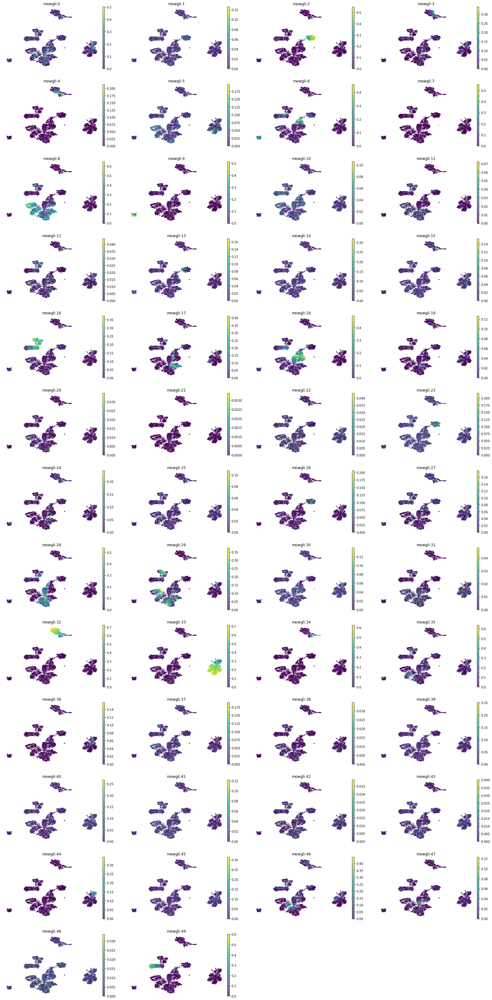

In [38]:
sc.pl.umap(
    mdata,
    alpha=0.7,
    color=[f"mowgli:{i}" for i in range(50)],
    legend_loc=None,
    legend_fontoutline=2,
    frameon=False,
)


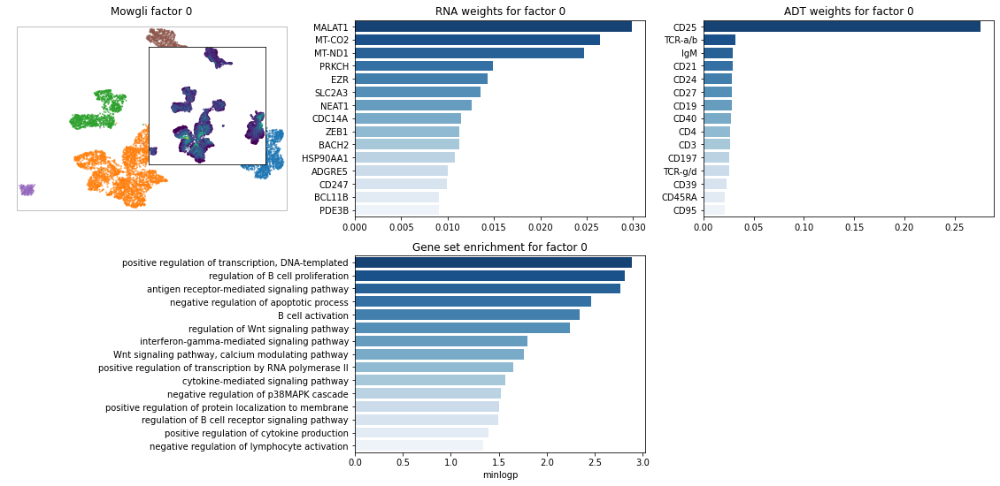

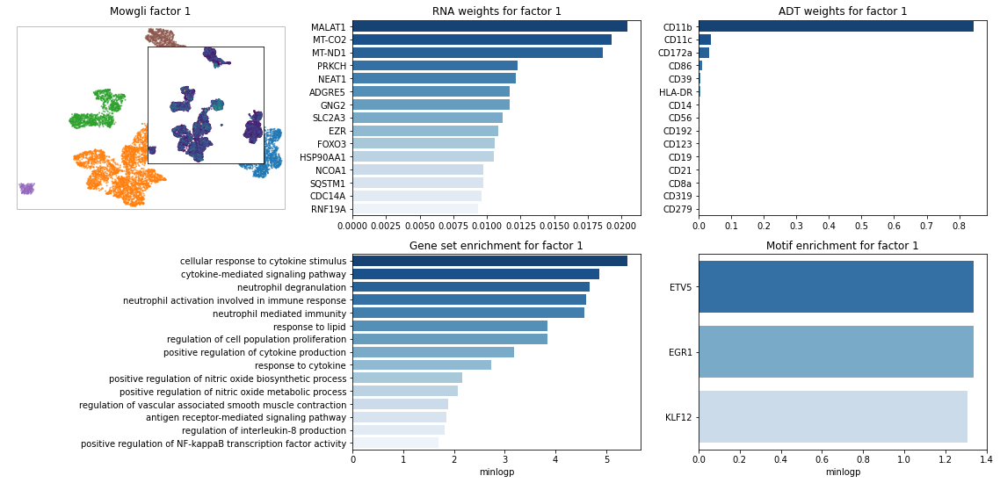

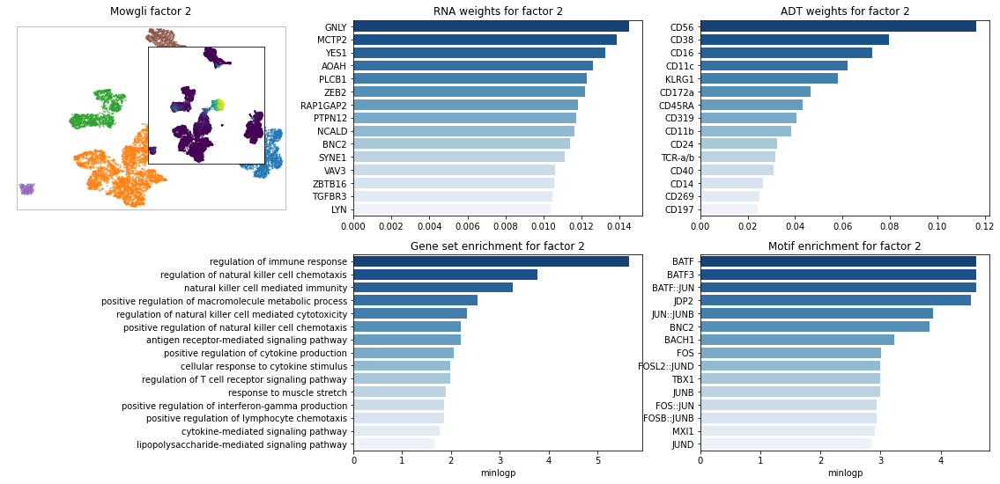

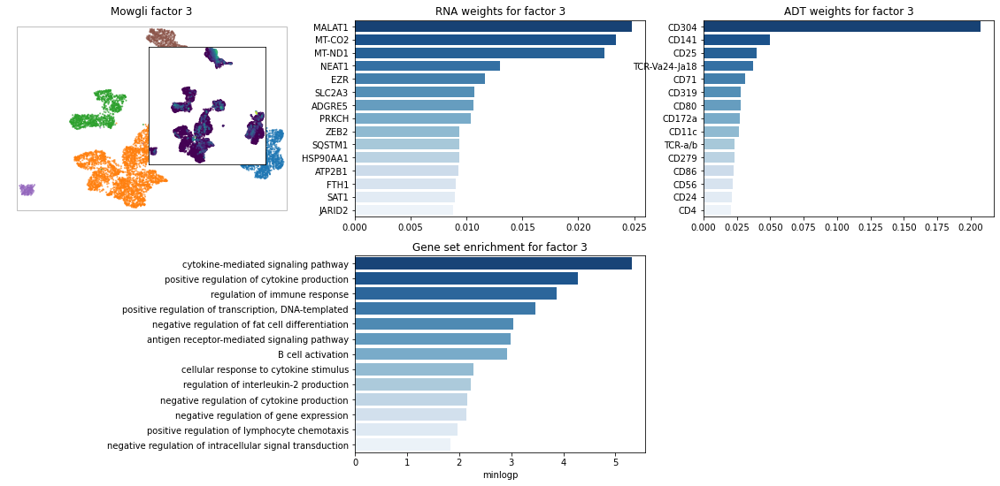

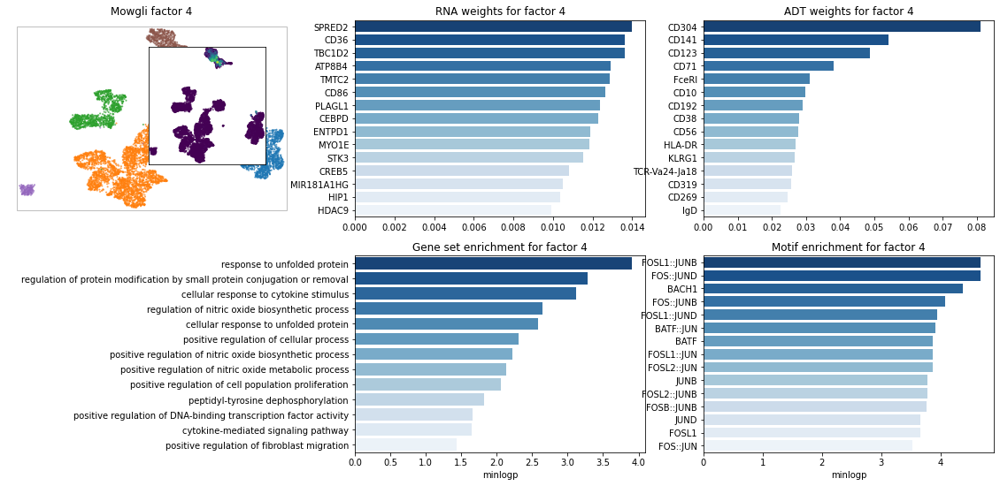

...

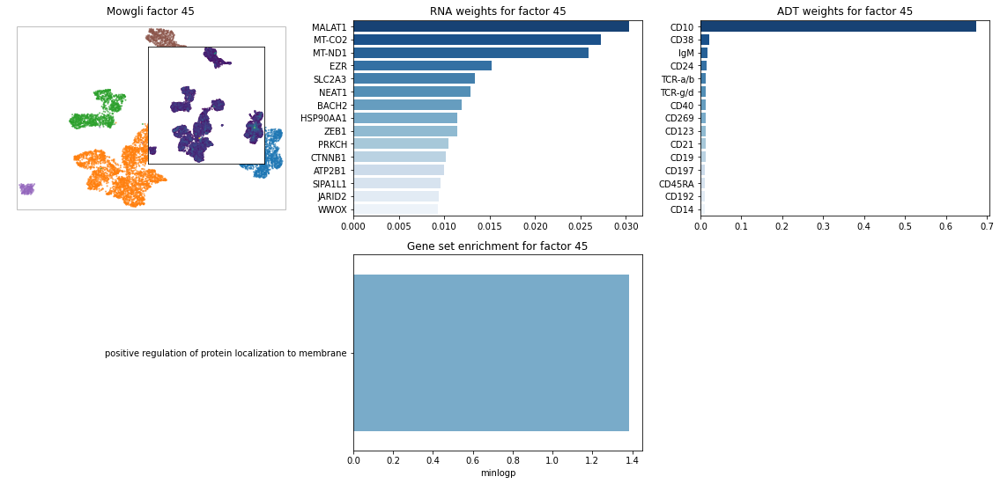

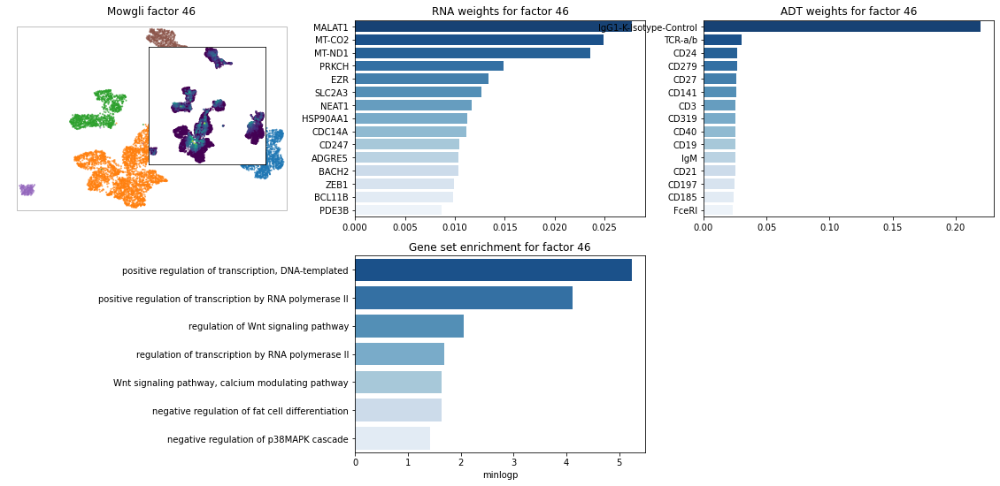

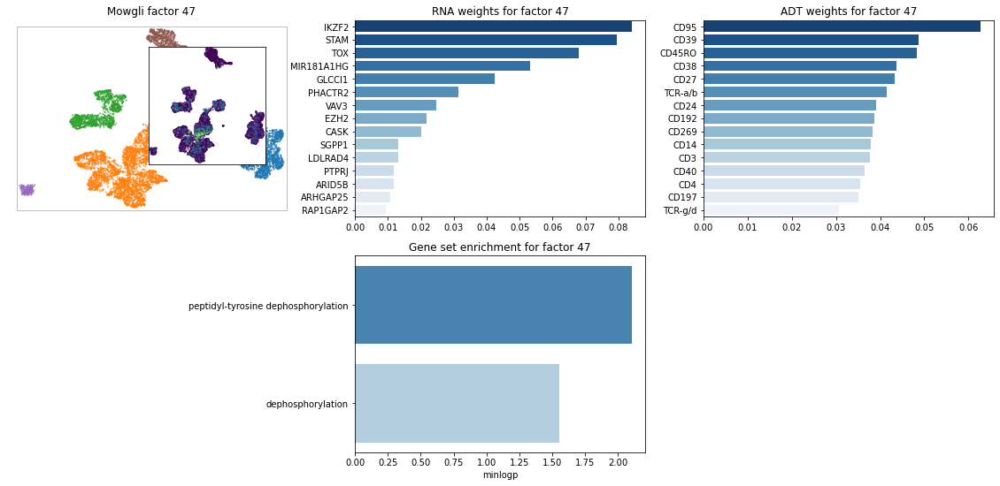

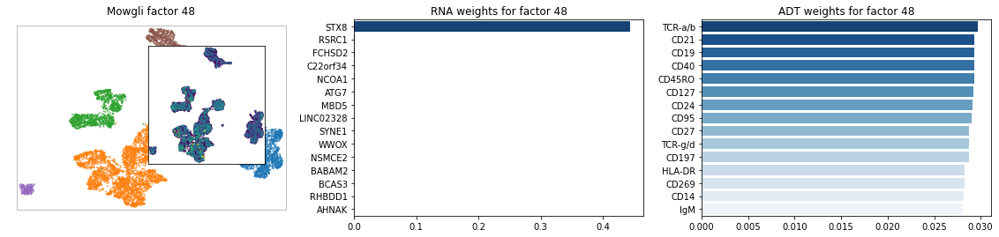

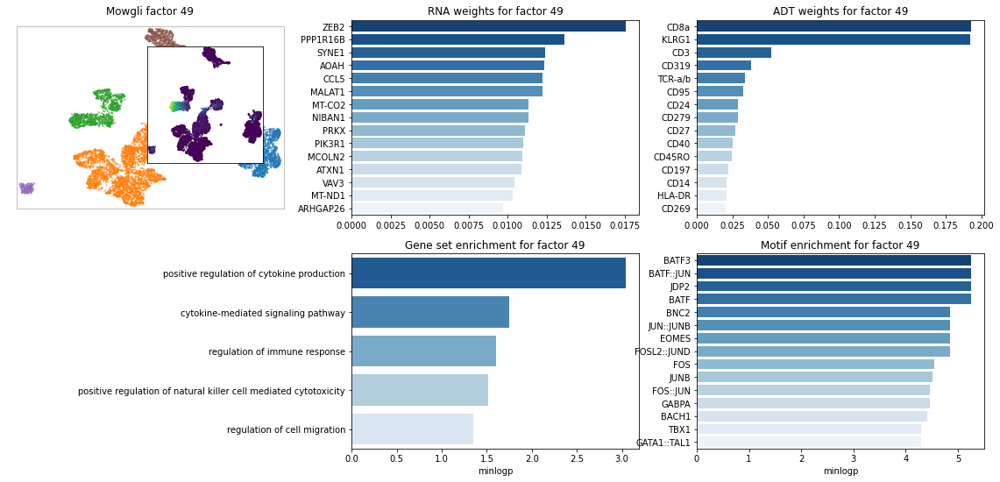

In [284]:
for i in range(50):
    plot_zoom(i, "cells|cytes")


In [49]:
# Compute the UMAP embedding
sc.pp.neighbors(mdata, n_neighbors=25, key_added="mowgli_neighbors", use_rep="X_mowgli")
sc.tl.leiden(mdata, resolution=.75, key_added="mowgli_leiden", neighbors_key="mowgli_neighbors")
# sc.tl.umap(mdata, neighbors_key="mowgli_neighbors")

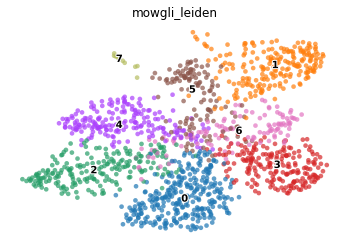

In [50]:
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color="mowgli_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()

In [51]:
adt_markers = [
    "adt:CD11c",
    "adt:CD183",
    "adt:CD9",
    "adt:IgA",
    "adt:CD1c",
    "adt:CD5",
    "adt:IgG",
    "adt:CD21",
    "adt:CD73",
    "adt:CD95",
    "adt:CD27",
    "adt:CD38",
    "adt:CD39",
    "adt:CD29",
    "adt:CD81",
    "adt:IgD",
    "adt:CD305",
    "adt:CD31",
    "adt:CD184",
    "adt:CD22",
    "adt:CD72",
    "adt:CD24",
    "adt:CD79b",
    "adt:IgM",
    "adt:CD45RB",
    "adt:CD62L",
    "adt:CD35",
    "adt:CD40",
    "adt:CD185",
    "adt:CD82",
    "adt:CD268",
    "adt:CD20",
    "adt:CD44",
    "adt:CD45",
    "adt:CD32",
    "adt:CD99",
    "adt:CD19",
    "adt:HLA-ABC",
    "adt:HLA-DR",
]
adt_markers = [x for x in adt_markers if x in mdata["adt"].var_names]


In [52]:
rna_markers = [
    "rna:ITGAX",  # "adt:CD11c", **
    "rna:CDXCR3",  # "adt:CD183", **
    "rna:CD9",  # "adt:CD9", **
    "rna:IGHA1",  # "adt:IgA", **
    "rna:CD1C",  # "adt:CD1c", **
    "rna:CD5",  # "adt:CD5", **
    "rna:IGHG1",  # "adt:IgG", **
    "rna:CR2",  # "adt:CD21", **
    "rna:NT5E",  # "adt:CD73", **
    "rna:FAS",  # "adt:CD95", **
    "rna:CD27",  # "adt:CD27", **
    "rna:CD38",  # "adt:CD38", **
    "rna:ENTPD1",  # "adt:CD39", **
    "rna:ITGB1",  # "adt:CD29", **
    "rna:CD81",  # "adt:CD81", **
    "rna:IGHD",  # "adt:IgD", **
    "rna:LAIR1",  # "adt:CD305", **
    "rna:PECAM1",  # "adt:CD31", **
    "rna:CXCR4",  # "adt:CD184", **
    "rna:CD22",  # "adt:CD22", **
    "rna:CD72",  # "adt:CD72", **
    "rna:CD24",  # "adt:CD24", **
    "rna:CD79B",  # "adt:CD79b", **
    "rna:IGHM",  # "adt:IgM", **
    # "rna:CD45RB", # "adt:CD45RB",
    "rna:SELL",  # "adt:CD62L", **
    "rna:CR1",  # "adt:CD35", **
    "rna:CD40",  # "adt:CD40", **
    "rna:CXCR5",  # "adt:CD185", **
    "rna:CD82",  # "adt:CD82", **
    "rna:TNFRSF13C",  # "adt:CD268", **
    "rna:MS4A1",  # "adt:CD20", **
    "rna:CD44",  # "adt:CD44", **
    "rna:PTPRC",  # "adt:CD45", **
    "rna:FCGR2A",  # "adt:CD32", **
    "rna:CD99",  # "adt:CD99", **
    "rna:CD19",  # "adt:CD19", **
    "rna:HLA-F",
    "rna:HLA-F-AS1",
    "rna:HLA-G",
    "rna:HLA-A",
    "rna:HLA-E",
    "rna:HLA-C",
    "rna:HLA-B",
    "rna:HLA-DRA",
    "rna:HLA-DRB5",
    "rna:HLA-DRB1",
    "rna:HLA-DQA1",
    "rna:HLA-DQB1",
    "rna:HLA-DQB1-AS1",
    "rna:HLA-DQA2",
    "rna:HLA-DQB2",
    "rna:HLA-DOB",
    "rna:HLA-DMB",
    "rna:HLA-DMA",
    "rna:HLA-DOA",
    "rna:HLA-DPA1",
    "rna:HLA-DPB1",
]
rna_markers = [x for x in rna_markers if x in rna_all_genes.var_names]


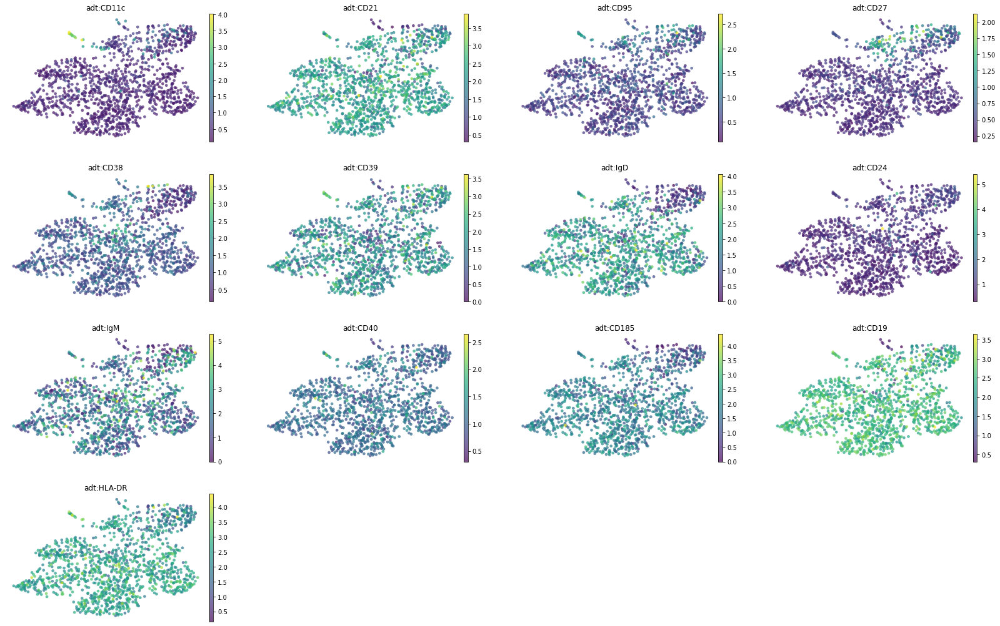

In [53]:
# Make the UMAP plot
mdata.obs[mdata["adt"].var_names] = mdata["adt"].X
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color=adt_markers,
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()

<ipython-input-234-0e59e970f60d>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs[rna_markers] = rna_all_genes[:, rna_markers].X.todense()
<ipython-input-234-0e59e970f60d>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  mdata.obs[rna_markers] = rna_all_genes[:, rna_markers].X.todense()
<ipython-input-234-0e59e970f60d>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(

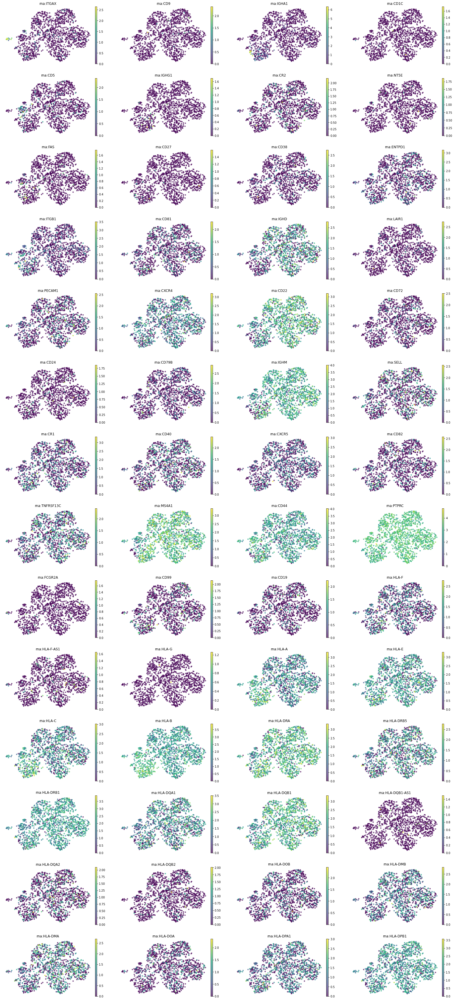

In [234]:
# Make the UMAP plot
mdata.obs[rna_markers] = rna_all_genes[:, rna_markers].X.todense()
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color=rna_markers,
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()


Trying to set attribute `.uns` of view, copying.


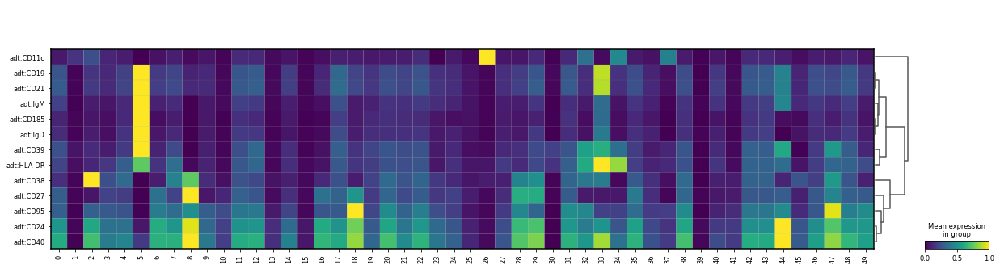

In [254]:
H_adt = ad.AnnData(H_mowgli["H_adt"])
H_adt.obs_names = mdata["adt"].var_names
H_adt.obs["dummy"] = pd.Categorical(H_adt.obs_names)
H_adt = H_adt[adt_markers]

sc.tl.dendrogram(H_adt, groupby="dummy")
sc.pl.matrixplot(H_adt, H_adt.var_names, groupby="dummy", dendrogram=True, standard_scale="group")

Trying to set attribute `.uns` of view, copying.


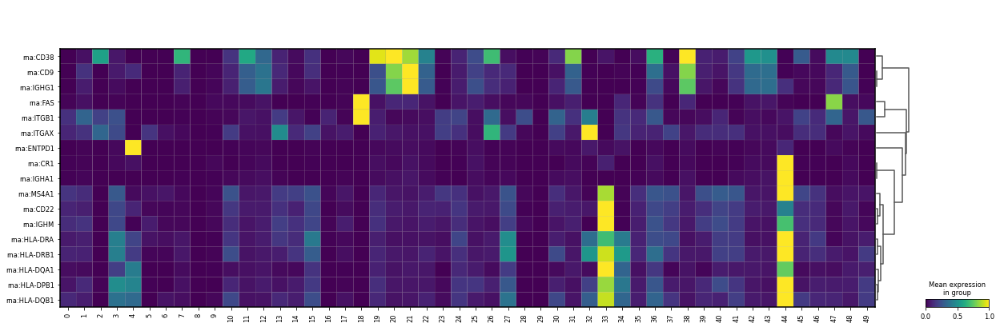

In [236]:
H_rna = ad.AnnData(H_mowgli["H_rna"])
H_rna.obs_names = mdata["rna"].var_names
H_rna.obs["dummy"] = pd.Categorical(H_rna.obs_names)
H_rna = H_rna[[m for m in rna_markers if m in H_rna.obs_names]]

sc.tl.dendrogram(H_rna, groupby="dummy")
sc.pl.matrixplot(H_rna, H_rna.var_names, groupby="dummy", dendrogram=True, standard_scale="group")

In [240]:
mdata.obs[[f"mowgli:{i}" for i in range(50)]] = mdata.obsm["X_mowgli"]

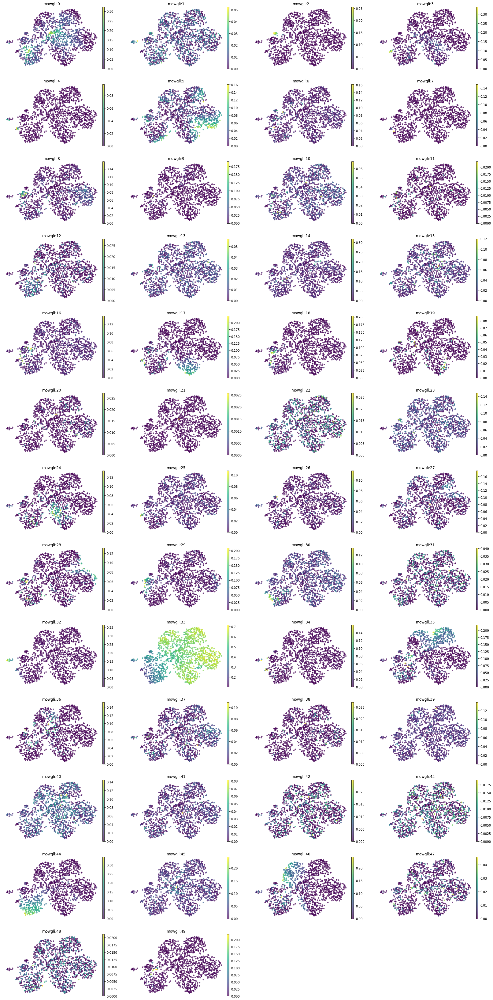

In [241]:
# Make the UMAP plot
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color=[f"mowgli:{i}" for i in range(50)],
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()


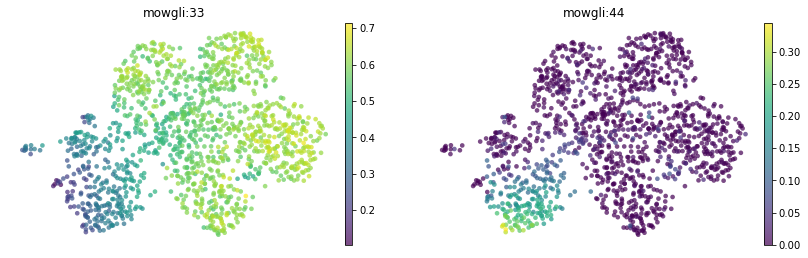

In [268]:
# Make the UMAP plot
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color=[
        "mowgli:33",
        "mowgli:44",
    ],
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()


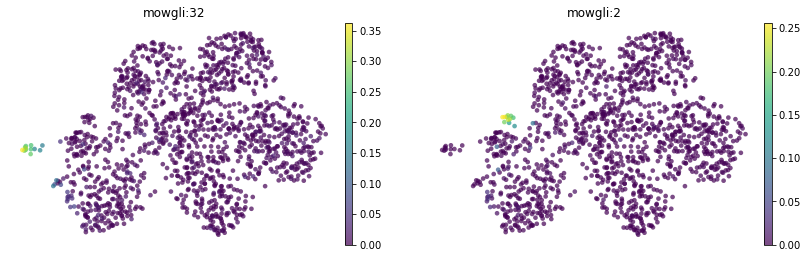

In [269]:
# Make the UMAP plot
ax = sc.pl.umap(
    mdata,
    alpha=0.7,
    color=[
        "mowgli:32",
        "mowgli:2",
    ],
    legend_loc="on data",
    legend_fontoutline=2,
    frameon=False,
    show=False,
)
plt.show()


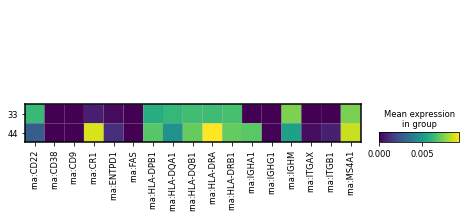

In [278]:
H_rna = ad.AnnData(H_mowgli["H_rna"])
H_rna.obs_names = mdata["rna"].var_names
H_rna.obs["dummy"] = pd.Categorical(H_rna.obs_names)
H_rna = H_rna[
    [m for m in rna_markers if m in H_rna.obs_names],
    [
        "33",
        "44",
    ],
]

sc.pl.matrixplot(
    H_rna,
    H_rna.var_names,
    groupby="dummy",
    dendrogram=False,
    swap_axes=True,
)


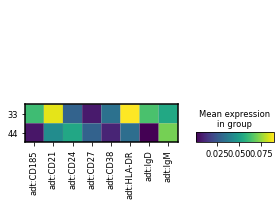

In [277]:
H_adt = ad.AnnData(H_mowgli["H_adt"])
H_adt.obs_names = mdata["adt"].var_names
H_adt.obs["dummy"] = pd.Categorical(H_adt.obs_names)
H_adt = H_adt[
    [
        "adt:IgD",
        "adt:IgM",
        "adt:CD27",
        "adt:CD24",
        "adt:HLA-DR",
        "adt:CD38",
        "adt:CD21",
        "adt:CD185",
    ],
    [
        "33",
        "44",
    ],
]

sc.pl.matrixplot(
    H_adt,
    H_adt.var_names,
    groupby="dummy",
    dendrogram=False,
    swap_axes=True,
)
